In [ ]:
import pandas as pd
pd.set_option("display.max_colwidth", 200)
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# supress warnings 
from warnings import filterwarnings
filterwarnings('ignore')

# *CLUSTERING USING PYCARET*

In [ ]:
data =  pd.read_csv('/content/drive/MyDrive/Colab Notebooks/CAPSTONE PROJECT/grocery_topics_info.csv')
data.drop(columns={'Unnamed: 0','norm_reviews','Document_No','title'},inplace=True)
data.head(2)

,reviewerID,sentiment,brand,len_reviewtext,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text
0,ATZQ5B67XZSFK,positive,hoosier hill farm,7,5.0,0.5454,"good, taste, love, great, buy, flavor, bag, price, eat, review",['good']
1,A1378UVM0U9PR9,positive,mrs dash,775,7.0,0.5599,"oil, cook, add, rice, sauce, noodles, water, chicken, use, spice","['spice', 'flavor', 'need', 'watch', 'salt', 'intake', 'need', 'yup', 'diverse', 'season', 'pretty', 'use', 'cook', 'meats', 'cook', 'veggies', 'especially', 'great', 'corn', 'bake', 'potatoes', '..."


In [ ]:
train_data = data.sample(frac=0.95, random_state=786).reset_index(drop=True)
data_unseen = data.drop(train_data.index).reset_index(drop=True)

In [ ]:
!pip install pycaret
from pycaret.utils import enable_colab
enable_colab()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Colab mode enabled.


In [ ]:
import pycaret
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [ ]:
#!pip install --upgrade numpy
#!pip install numpy==1.20.0
import numpy as np

In [ ]:
from pycaret.clustering import *

In [ ]:
#setting up the pycaret environment
#clust = setup(train_data = train_data)

In [ ]:
#setting up the pycaret environment
clu = setup(train_data, normalize = True, pca = True,silent =True, combine_rare_levels= True, remove_multicollinearity= True, session_id = 123)#,ignore_features=['reviewerID']

,Description,Value
0,session_id,123
1,Original Data,"(10347, 8)"
2,Missing Values,False
3,Numeric Features,3
4,Categorical Features,5
5,Ordinal Features,False
6,High Cardinality Features,False
7,High Cardinality Method,None
8,Transformed Data,"(10347, 40)"
9,CPU Jobs,-1


INFO:logs:create_model_container: 0
INFO:logs:master_model_container: 0
INFO:logs:display_container: 1
INFO:logs:Pipeline(memory=None,
         steps=[('dtypes',
                 DataTypes_Auto_infer(categorical_features=[],
                                      display_types=False, features_todrop=[],
                                      id_columns=[], ml_usecase='regression',
                                      numerical_features=[],
                                      target='UNSUPERVISED_DUMMY_TARGET',
                                      time_features=[])),
                ('imputer',
                 Simple_Imputer(categorical_strategy='most frequent',
                                fill_value_categorical=None,
                                fill_value_numerical=Non...
                 Fix_multicollinearity(correlation_with_target_preference=None,
                                       correlation_with_target_threshold=0.0,
                                       target_va

In [ ]:
models()

INFO:logs:gpu_param set to False


,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.AffinityPropagation
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeClustering
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
kmeans = create_model('kmeans',num_clusters=5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.196,2313.6177,1.602,0,0,0


INFO:logs:create_model_container: 1
INFO:logs:master_model_container: 1
INFO:logs:display_container: 2
INFO:logs:KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
hclust = create_model('hclust',num_clusters=5)

,Silhouette,Calinski-Harabasz,Davies-Bouldin,Homogeneity,Rand Index,Completeness
0,0.1854,1884.4457,1.8548,0,0,0


INFO:logs:create_model_container: 2
INFO:logs:master_model_container: 2
INFO:logs:display_container: 3
INFO:logs:AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=None, distance_threshold=None,
                        linkage='ward', memory=None, n_clusters=5)
INFO:logs:create_model() succesfully completed......................................


In [ ]:
#assigning model
kmean_results = assign_model(kmeans)
kmean_results.head()

INFO:logs:Initializing assign_model()
INFO:logs:assign_model(model=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), transformation=False, score=True, verbose=True)
INFO:logs:Checking exceptions
INFO:logs:Determining Trained Model
INFO:logs:Trained Model : K-Means Clustering
INFO:logs:Copying data
INFO:logs:(10347, 9)
INFO:logs:assign_model() succesfully completed......................................


,reviewerID,sentiment,brand,len_reviewtext,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Cluster
0,A2Q18N99OX9J2N,positive,klio,1943,6.0,0.2447,"tea, flavor, green, drink, taste, bag, teas, matcha, good, water","['buy', 'plant', 'form', 'origin', 'country', 'select', 'right', 'plant', 'shape', 'color', 'smell', 'sideritis', 'plant', 'grow', 'mountainous', 'regions', 'spain', 'turkey', 'include', 'albania'...",Cluster 3
1,A3J7QOYMJTR51F,neutral,follow your heart,1148,4.0,0.2659,"taste, bottle, buy, good, time, water, use, try, know, drink","['discover', 'daughter', 'egg', 'allergy', 'allergic', 'reaction', 'flu', 'shoot', 'baby', 'confirm', 'age', 'hard', 'deny', 'treat', 'party', 'tell', 'eat', 'things', 'certain', 'type', 'fortune'...",Cluster 0
2,A1826M0FEECZRY,positive,arm hammer,314,5.0,0.4666,"good, taste, love, great, buy, flavor, bag, price, eat, review","['love', 'use', 'product', 'feel', 'great', 'allow', 'kid', 'clean', 'bathroom', 'work', 'great', 'perfume', 'scent', 'linger', 'laundry', 'clothe', 'towel', 'bed', 'fresh', 'clean', 'time', 'rece...",Cluster 0
3,A1ND1UOCUQ9ALO,positive,benchmark bouquets,287,2.0,0.8406,"box, order, package, product, open, receive, bag, arrive, look, picture","['order', 'mother', 'mother', 'day', 'nervous', 'read', 'bad', 'horror', 'stories', 'review', 'order', 'flower', 'online', 'come', 'today', 'mom', 'excite', 'happy', 'exceed', 'expectations', 'lot...",Cluster 4
4,A35042IWDE456Y,positive,cheez it,514,5.0,0.5707,"good, taste, love, great, buy, flavor, bag, price, eat, review","['cheez', 'toaster', 'extra', 'toasty', 'advertise', 'consistent', 'lucky', 'grab', 'handful', 'extra', 'toasty', 'ones', 'eat', 'row', 'start', 'taste', 'regular', 'cheez', 'taste', 'bud', 'accus...",Cluster 0


In [ ]:
plot_model(kmeans)

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


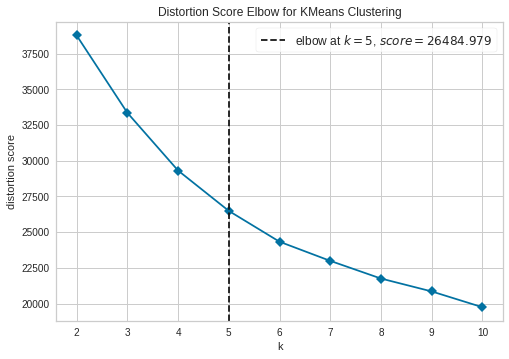

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot = 'elbow')

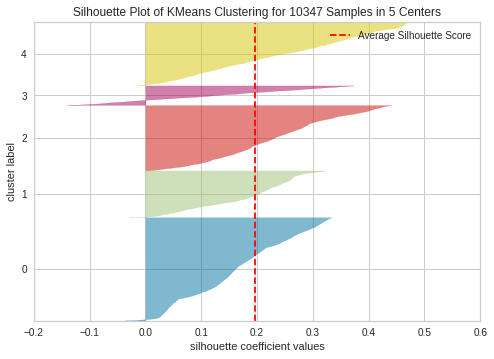

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot = 'silhouette')

In [ ]:
plot_model(kmeans, plot = 'distribution') #to see size of clusters

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot = 'distribution', feature = 'sentiment')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


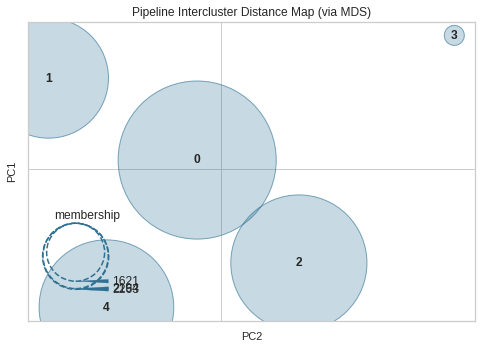

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(kmeans, plot ='distance')

In [ ]:
plot_model(kmeans, plot ='tsne')

INFO:logs:Rendering Visual


INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
#evaluating model
#evaluate_model(kmeans)

In [ ]:
#tuning the model
#tuned_kmeans = tune_model(model = 'kmeans',supervised_target='sentiment')

In [ ]:
#predicting the model
kmeans_predictions = predict_model(model = kmeans, data = data_unseen)
kmeans_predictions.head()

INFO:logs:Initializing predict_model()
INFO:logs:predict_model(estimator=KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=5, n_init=10, n_jobs=-1, precompute_distances='deprecated',
       random_state=123, tol=0.0001, verbose=0), ml_usecase=MLUsecase.CLUSTERING)


,reviewerID,sentiment,brand,len_reviewtext,Dominant_Topic,Topic_Perc_Contrib,Keywords,Text,Cluster
0,ARZH0U4FUPQR,negative,macfarms,149,2.0,0.7315,"box, order, package, product, open, receive, bag, arrive, look, picture","['receive', 'package', 'open', 'amazon', 'mail', 'box', 'buy', 'brand', 'macadamia', 'package', 'untouched']",Cluster 4
1,AQ2VVIQ9CKNQC,negative,kisses,501,2.0,0.5038,"box, order, package, product, open, receive, bag, arrive, look, picture","['receive', 'bag', 'hershey', 'kiss', 'happy', 'open', 'bag', 'kiss', 'mis', 'shapened', 'appear', 'expose', 'heat', 'chill', 'save', 'product', 'buy', 'price', 'great', 'value', 'realize', 'kiss'...",Cluster 2
2,A367USY4FO6WFZ,negative,justin s nut butter,222,2.0,0.8112,"box, order, package, product, open, receive, bag, arrive, look, picture","['receive', 'box', 'container', 'completely', 'open', 'pack', 'almond', 'butter', 'miss', 'instead', 'idea', 'clearly', 'little', 'regard', 'shipment']",Cluster 4
3,AY8SH6S7KJ5RP,negative,fiberyum,123,2.0,0.8047,"box, order, package, product, open, receive, bag, arrive, look, picture","['receive', 'item', 'lid', 'tightly', 'seal', 'break', 'leak', 'box', 'product']",Cluster 4
4,A36Y0XY64MJ35Q,negative,artisana,54,2.0,0.5459,"box, order, package, product, open, receive, bag, arrive, look, picture","['recived', 'jaw', 'greacy', 'leak']",Cluster 2
